In [3]:
import anndata as ad
import numpy as np
from sklearn.linear_model import Ridge
import os

# ========= SETTINGS =========
BASE_PATH = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
N_FOLDS = 5
CHECK_CELL_IDS = True  # If cell_id is in adata.obs

# ========= MAIN CHECK LOOP =========
for fold in range(N_FOLDS):
    print(f"\n================ FOLD {fold} ================")
    
    # ---- Construct file paths using actual filenames ----
    X_train_path = os.path.join(BASE_PATH, f"fold_{fold}_train_combat_both.h5ad")
    X_test_path  = os.path.join(BASE_PATH, f"fold_{fold}_test_combat_both.h5ad")
    
    # ---- Load data ----
    adata_train = ad.read_h5ad(X_train_path)
    adata_test  = ad.read_h5ad(X_test_path)
    
    # ---- Extract matrices ----
    X_train = adata_train.X
    Y_train = adata_train.layers['Y'] if 'Y' in adata_train.layers else adata_train.X
    X_test  = adata_test.X
    Y_test  = adata_test.layers['Y'] if 'Y' in adata_test.layers else adata_test.X
    
    if CHECK_CELL_IDS:
        cell_train = adata_train.obs['cell_id'].values
        cell_test  = adata_test.obs['cell_id'].values
    
    # =========================================
    # 1. SHAPE CHECK
    # =========================================
    print("\n[1] Shape Check")
    print("X_train:", X_train.shape)
    print("Y_train:", Y_train.shape)
    print("X_test :", X_test.shape)
    print("Y_test :", Y_test.shape)
    
    assert X_train.shape[0] == Y_train.shape[0], "Mismatch in TRAIN samples!"
    assert X_test.shape[0] == Y_test.shape[0], "Mismatch in TEST samples!"
    
    # =========================================
    # 2. NaN CHECK
    # =========================================
    print("\n[2] NaN Check")
    print("NaNs in X_train:", np.isnan(X_train).sum())
    print("NaNs in Y_train:", np.isnan(Y_train).sum())
    print("NaNs in X_test :", np.isnan(X_test).sum())
    print("NaNs in Y_test :", np.isnan(Y_test).sum())
    
    # =========================================
    # 3. VARIANCE CHECK
    # =========================================
    print("\n[3] Variance Check")
    print("X_train mean std:", np.mean(np.std(X_train, axis=0)))
    print("Y_train mean std:", np.mean(np.std(Y_train, axis=0)))
    
    # =========================================
    # 4. VALUE RANGE CHECK
    # =========================================
    print("\n[4] Value Range")
    print("X_train min/max:", np.min(X_train), np.max(X_train))
    print("Y_train min/max:", np.min(Y_train), np.max(Y_train))
    
    # =========================================
    # 5. SAMPLE ALIGNMENT CHECK
    # =========================================
    print("\n[5] Sample Alignment (first sample preview)")
    print("X_train[0,:5]:", X_train[0,:5])
    print("Y_train[0,:5]:", Y_train[0,:5])
    
    # =========================================
    # 6. FEATURE DIMENSION CHECK
    # =========================================
    print("\n[6] Feature Count")
    print("Number of features:", X_train.shape[1])
    
    # =========================================
    # 7. CELL ID CHECK (if available)
    # =========================================
    if CHECK_CELL_IDS:
        print("\n[7] Cell ID Check")
        print("Unique train cells:", np.unique(cell_train))
        print("Unique test cells :", np.unique(cell_test))
        overlap = set(np.unique(cell_train)).intersection(np.unique(cell_test))
        print("Overlap between train/test cells:", overlap)
    
    # =========================================
    # 8. QUICK MODEL SANITY CHECK
    # =========================================
    print("\n[8] Quick Model Test")
    try:
        model = Ridge()
        model.fit(X_train[:100], Y_train[:100])
        pred = model.predict(X_test[:10])
        print("Prediction shape:", pred.shape)
        print("Prediction std:", np.std(pred))
    except Exception as e:
        print("Model failed:", e)

print("\n✅ ALL CHECKS COMPLETED")


================ FOLD 0 ================

[1] Shape Check
X_train: (859137, 978)
Y_train: (859137, 978)
X_test : (174584, 978)
Y_test : (174584, 978)

[2] NaN Check
NaNs in X_train: 0
NaNs in Y_train: 0
NaNs in X_test : 0
NaNs in Y_test : 0

[3] Variance Check
X_train mean std: 1.4284790529023734
Y_train mean std: 1.4284790529023734

[4] Value Range
X_train min/max: -33.59891318451735 31.64247061638443
Y_train min/max: -33.59891318451735 31.64247061638443

[5] Sample Alignment (first sample preview)
X_train[0,:5]: [9.5077287  4.14524465 8.44260322 9.89695223 9.41639992]
Y_train[0,:5]: [9.5077287  4.14524465 8.44260322 9.89695223 9.41639992]

[6] Feature Count
Number of features: 978

[7] Cell ID Check
Unique train cells: ['A375' 'A549' 'A673' 'AGS' 'ASC' 'ASC.C' 'BT20' 'CD34' 'CL34' 'CORL23'
 'COV644' 'DV90' 'EFO27' 'FIBRNPC' 'H1299' 'HA1E' 'HCC15' 'HCC515'
 'HCT116' 'HEC108' 'HEK293T' 'HELA' 'HEPG2' 'HL60' 'HME1' 'HS27A' 'HS578T'
 'HT115' 'HT29' 'HUES3' 'HUH7' 'HUVEC' 'JHUEM2' 'JURKA

In [2]:
import os

BASE_PATH = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
print(os.listdir(BASE_PATH))

['fold_2_train_combat_both.h5ad', 'fold_1_train_combat_both.h5ad', 'fold_1_test_combat_both.h5ad', 'fold_4_test_combat_both.h5ad', 'fold_4_train_combat_both.h5ad', 'fold_2_test_combat_both.h5ad', 'fold_0_test_combat_both.h5ad', 'fold_0_train_combat_both.h5ad', 'fold_3_test_combat_both.h5ad', 'fold_3_train_combat_both.h5ad']


In [6]:
import scanpy as sc
import pandas as pd

# Load your dataset (example: fold_0_train_combat_both.h5ad)
adata = sc.read_h5ad("/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both/fold_0_train_combat_both.h5ad")

# Convert metadata to pandas dataframe
df = adata.obs.copy()

# Quick check: do we have 'pert_dose' column?
print(df.columns)

# Now we can inspect pert_dose
print("Dose column overview:")
print(df['pert_dose'].describe())

# Check for zeros or negative values
print("\nNumber of zero doses:", (df['pert_dose'] == 0).sum())
print("Number of negative doses:", (df['pert_dose'] < 0).sum())

Index(['dataset_name', 'sig_id', 'pert_id', 'pert_iname', 'pert_type',
       'cell_id', 'pert_idose', 'pert_itime', 'condition', 'canonical_smiles',
       'valid_smiles', 'pert_dose', 'pert_dose_unit', 'inchi_key', 'chembl_id',
       'mechanism_of_action', 'action_type', 'action_type_filtered',
       'mechanism_of_action_filtered', 'split', 'combined_batch'],
      dtype='object')
Dose column overview:
count    859137.000000
mean        -50.079099
std         188.291188
min        -666.000000
25%           0.370000
50%           5.000000
75%          10.000000
max         100.000000
Name: pert_dose, dtype: float64

Number of zero doses: 0
Number of negative doses: 73261


In [7]:
df['pert_dose_clean'] = df['pert_dose'].copy()
df.loc[df['pert_dose_clean'] < 0, 'pert_dose_clean'] = 0

In [8]:
# Check for zero doses after cleaning
num_zero_doses = (df['pert_dose_clean'] == 0).sum()
total_samples = len(df)

print(f"Number of zero doses: {num_zero_doses} / {total_samples}")
print(f"Percentage of zero doses: {num_zero_doses / total_samples * 100:.2f}%")

Number of zero doses: 73261 / 859137
Percentage of zero doses: 8.53%


In [12]:
# ============================================================
# Full Drug-Blind Prediction Pipeline for Your 5-Fold Split
# ============================================================

import os
import pandas as pd
import numpy as np
import scanpy as sc
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr

# Try importing RDKit for SMILES processing
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not found. Using random fingerprints.")

# --------------------------
# Helper Functions
# --------------------------
def smiles_to_fp(smiles, n_bits=1024):
    """Convert SMILES string to Morgan fingerprint (ECFP4)"""
    if not RDKIT_AVAILABLE:
        return np.random.randint(0, 2, n_bits)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

def evaluate_predictions(y_true, y_pred, label="Model"):
    """Pearson correlation per sample + overall R2"""
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r): r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# --------------------------
# Load Split Files
# --------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"

# Replace fold number as needed, example: fold_0
fold_num = 0
train_file = os.path.join(split_dir, f"fold_{fold_num}_train_combat_both.h5ad")
test_file  = os.path.join(split_dir, f"fold_{fold_num}_test_combat_both.h5ad")

adata_train = sc.read_h5ad(train_file)
adata_test  = sc.read_h5ad(test_file)

df_train = adata_train.obs.copy()
df_test  = adata_test.obs.copy()

Y_train = adata_train.X.copy()
Y_test  = adata_test.X.copy()

# --------------------------
# Fix Dose and Controls
# --------------------------
# Convert controls (DMSO) to dose = 0
df_train.loc[df_train['pert_id'] == 'DMSO', 'pert_dose'] = 0
df_test.loc[df_test['pert_id'] == 'DMSO', 'pert_dose'] = 0

# --------------------------
# Feature Engineering
# --------------------------

# 1. Drug fingerprints
all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
fp_map = {s: smiles_to_fp(s) for s in all_smiles}

# Map fingerprints safely
def map_fp(series):
    fps = []
    for s in series:
        fp = fp_map.get(s)
        if fp is None:
            fps.append(np.zeros(len(next(iter(fp_map.values())))))
        else:
            fps.append(fp)
    return np.array(fps)

X_train_drug = map_fp(df_train['canonical_smiles'])
X_test_drug  = map_fp(df_test['canonical_smiles'])

# 2. Cell line one-hot
cell_encoder = OneHotEncoder(sparse_output=False)
X_train_cell = cell_encoder.fit_transform(df_train[['cell_id']])
X_test_cell  = cell_encoder.transform(df_test[['cell_id']])

# 3. Dose scaling
dose_scaler = StandardScaler()
X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

# Combine features
X_train = np.hstack([X_train_drug, X_train_cell, X_train_dose])
X_test  = np.hstack([X_test_drug, X_test_cell, X_test_dose])

print(f"Feature shapes: Train={X_train.shape}, Test={X_test.shape}")

# --------------------------
# Baseline Models
# --------------------------

# 1. Global mean
global_mean = np.mean(Y_train, axis=0)
y_pred_global_mean = np.tile(global_mean, (len(Y_test), 1))
evaluate_predictions(Y_test, y_pred_global_mean, label="Global Mean")

# 2. Cell-specific mean
cell_means = {}
for cell in df_train['cell_id'].unique():
    mask = df_train['cell_id'] == cell
    if mask.any():
        cell_means[cell] = np.mean(Y_train[mask], axis=0)
    else:
        cell_means[cell] = global_mean

# Map cell means safely
y_pred_cell_mean = np.array([cell_means[cell] for cell in df_test['cell_id']])
evaluate_predictions(Y_test, y_pred_cell_mean, label="Cell-Specific Mean")

# --------------------------
# Machine Learning Models
# --------------------------

# Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, Y_train)
y_pred_ridge = ridge.predict(X_test)
evaluate_predictions(Y_test, y_pred_ridge, label="Ridge Regression")

# Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42)
rf.fit(X_train, Y_train)
y_pred_rf = rf.predict(X_test)
evaluate_predictions(Y_test, y_pred_rf, label="Random Forest")

print("\n✅ Fold", fold_num, "completed successfully!")

[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerator
[12:54:41] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(859137, 1107), Test=(174584, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.320
[Ridge Regression] Avg Pearson: 0.875 | Avg R2: 0.316
[Random Forest] Avg Pearson: 0.862 | Avg R2: 0.267

✅ Fold 0 completed successfully!


In [5]:
# ============================================================
# Delta-Based Ridge + Random Forest Regression (with SMILES) for One Fold
# ============================================================

import os
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr

# --------------------------
# Helper Functions
# --------------------------
def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r): r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# --------------------------
# Load Data (One Fold)
# --------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
fold_num = 0

train_file = os.path.join(split_dir, f"fold_{fold_num}_train_combat_both.h5ad")
test_file  = os.path.join(split_dir, f"fold_{fold_num}_test_combat_both.h5ad")

adata_train = sc.read_h5ad(train_file)
adata_test  = sc.read_h5ad(test_file)

df_train = adata_train.obs.copy()
df_test  = adata_test.obs.copy()

Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

# --------------------------
# Fix dose for controls
# --------------------------
df_train.loc[df_train['pert_id'] == 'DMSO', 'pert_dose'] = 0
df_test.loc[df_test['pert_id'] == 'DMSO', 'pert_dose'] = 0

# --------------------------
# Compute cell-specific control mean
# --------------------------
global_mean = np.mean(Y_train, axis=0)

cell_means_train = {}
for cell in df_train['cell_id'].unique():
    mask = (df_train['cell_id'] == cell) & (df_train['pert_id'] == 'DMSO')
    idx = np.where(mask)[0]
    if len(idx) > 0:
        cell_means_train[cell] = np.mean(Y_train[idx], axis=0)
    else:
        cell_means_train[cell] = global_mean

# --------------------------
# Compute deltas for training
# --------------------------
Y_train_delta = np.array([
    Y_train[i] - cell_means_train[df_train.iloc[i]['cell_id']]
    for i in range(len(Y_train))
])

# --------------------------
# Feature Engineering (Drug + Cell + Dose)
# --------------------------
# SMILES / Drug fingerprints
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("RDKit not found. Using random fingerprints.")

def smiles_to_fp(smiles, n_bits=1024):
    if not RDKIT_AVAILABLE:
        return np.random.randint(0,2,n_bits)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
fp_map = {s: smiles_to_fp(s) for s in all_smiles}

def map_fp(series):
    return np.array([fp_map.get(s, np.zeros(len(next(iter(fp_map.values()))))) for s in series])

X_train_drug = map_fp(df_train['canonical_smiles'])
X_test_drug  = map_fp(df_test['canonical_smiles'])

# Cell one-hot
cell_encoder = OneHotEncoder(sparse_output=False)
X_train_cell = cell_encoder.fit_transform(df_train[['cell_id']])
X_test_cell  = cell_encoder.transform(df_test[['cell_id']])

# Dose scaling
dose_scaler = StandardScaler()
X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

# Combine all features
X_train = np.hstack([X_train_drug, X_train_cell, X_train_dose])
X_test  = np.hstack([X_test_drug, X_test_cell, X_test_dose])

print(f"Feature shapes: Train={X_train.shape}, Test={X_test.shape}")

# --------------------------
# Baseline Predictions
# --------------------------
# Global mean
y_pred_global = np.tile(global_mean, (len(Y_test), 1))
evaluate_predictions(Y_test, y_pred_global, label="Global Mean")

# Cell-specific mean
y_pred_cell = np.array([
    cell_means_train.get(c, global_mean)
    for c in df_test['cell_id']
])
evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean")

# --------------------------
# Delta-based Ridge Regression
# --------------------------
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, Y_train_delta)
y_pred_delta_ridge = ridge.predict(X_test)

y_pred_ridge_final = np.array([
    cell_means_train.get(c, global_mean) + y_pred_delta_ridge[i]
    for i, c in enumerate(df_test['cell_id'])
])
evaluate_predictions(Y_test, y_pred_ridge_final, label="Ridge Regression (Delta)")

# --------------------------
# Delta-based Random Forest
# --------------------------
rf = RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=16, random_state=42)
rf.fit(X_train, Y_train_delta)
y_pred_delta_rf = rf.predict(X_test)

y_pred_rf_final = np.array([
    cell_means_train.get(c, global_mean) + y_pred_delta_rf[i]
    for i, c in enumerate(df_test['cell_id'])
])
evaluate_predictions(Y_test, y_pred_rf_final, label="Random Forest (Delta)")

print("\n✅ Fold", fold_num, "completed successfully!")

[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerator
[16:12:19] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(859137, 1107), Test=(174584, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.311
[Ridge Regression (Delta)] Avg Pearson: 0.875 | Avg R2: 0.316
[Random Forest (Delta)] Avg Pearson: 0.885 | Avg R2: 0.370

✅ Fold 0 completed successfully!


In [20]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import scanpy as sc

In [21]:
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not found. Using random fingerprints for simulation.")

In [22]:
def smiles_to_fp(smiles, n_bits=1024):
    if not RDKIT_AVAILABLE:
        return np.random.randint(0, 2, n_bits)  # Random bits if RDKit not available
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

In [23]:
def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r): r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

In [24]:
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

In [25]:
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")
    
    # Load h5ad files
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))
    
    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()
    
    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X


================ Fold 0 ================

================ Fold 1 ================

================ Fold 2 ================

================ Fold 3 ================

================ Fold 4 ================


In [26]:
all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
fp_map = {s: smiles_to_fp(s) for s in all_smiles}
X_train_drug = np.stack([fp_map[s] for s in df_train['canonical_smiles']])
X_test_drug  = np.stack([fp_map[s] for s in df_test['canonical_smiles']])

[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerator
[16:19:49] DEPRECATION WARNING: please use MorganGenerat

In [27]:
cell_encoder = OneHotEncoder(sparse_output=False)
X_train_cells = cell_encoder.fit_transform(df_train[['cell_id']])
X_test_cells  = cell_encoder.transform(df_test[['cell_id']])

In [28]:
dose_scaler = StandardScaler()
X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

In [29]:
X_train = np.hstack([X_train_drug, X_train_cells, X_train_dose])
X_test  = np.hstack([X_test_drug, X_test_cells, X_test_dose])

In [33]:
all_fold_results = []

for fold in range(n_folds):
    ...
    result = evaluate_predictions(Y_test, y_pred_global, label=f"Global Mean Fold {fold}")
    all_fold_results.append(result)

# Compute overall average across folds
avg_pearson_all = np.mean([r['avg_pearson'] for r in all_fold_results])
avg_r2_all = np.mean([r['avg_r2'] for r in all_fold_results])
print(f"Overall Global Mean: Avg Pearson={avg_pearson_all:.3f}, Avg R2={avg_r2_all:.3f}")
cells = df_train['cell_id'].unique()
cell_means = {}
for cell in cells:
    mask = df_train['cell_id'] == cell
    cell_means[cell] = np.mean(Y_train[mask], axis=0) if mask.any() else global_mean
y_pred_cell = np.stack([cell_means[c] for c in df_test['cell_id']])
evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean")

[Global Mean Fold 0] Avg Pearson: 0.796 | Avg R2: -0.000
[Global Mean Fold 1] Avg Pearson: 0.796 | Avg R2: -0.000
[Global Mean Fold 2] Avg Pearson: 0.796 | Avg R2: -0.000
[Global Mean Fold 3] Avg Pearson: 0.796 | Avg R2: -0.000
[Global Mean Fold 4] Avg Pearson: 0.796 | Avg R2: -0.000
Overall Global Mean: Avg Pearson=0.796, Avg R2=-0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.320


{'avg_pearson': np.float64(0.876935279756557), 'avg_r2': 0.3198862005243852}

In [2]:
import os
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import scanpy as sc

# -----------------------------
# Evaluation function
# -----------------------------
def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r):
            r = 0.0
        pearsons.append(r)

    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')

    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# -----------------------------
# Config
# -----------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

# Store results
results = {
    "global": [],
    "cell": []
}

# -----------------------------
# Cross-validation loop
# -----------------------------
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")

    # Load data
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))

    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()

    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

    # -----------------------------
    # Global Mean Baseline
    # -----------------------------
    global_mean = np.mean(Y_train, axis=0)
    y_pred_global = np.tile(global_mean, (len(Y_test), 1))

    res_global = evaluate_predictions(Y_test, y_pred_global, label="Global Mean")
    results["global"].append(res_global)

    # -----------------------------
    # Cell-Specific Mean Baseline
    # -----------------------------
    cells = df_train['cell_id'].unique()
    cell_means = {}

    for cell in cells:
        mask = df_train['cell_id'] == cell
        cell_means[cell] = np.mean(Y_train[mask], axis=0) if mask.any() else global_mean

    y_pred_cell = np.stack([
        cell_means[c] if c in cell_means else global_mean
        for c in df_test['cell_id']
    ])

    res_cell = evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean")
    results["cell"].append(res_cell)

    print(f"✅ Fold {fold} completed!")

# -----------------------------
# Final Results
# -----------------------------
print("\n================ FINAL BASELINE RESULTS ================")

for model_name, res_list in results.items():
    avg_pearson = np.mean([r['avg_pearson'] for r in res_list])
    avg_r2 = np.mean([r['avg_r2'] for r in res_list])

    print(f"\n[{model_name.upper()}]")
    print(f"Avg Pearson: {avg_pearson:.3f}")
    print(f"Avg R2: {avg_r2:.3f}")


================ Fold 0 ================
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.320
✅ Fold 0 completed!

================ Fold 1 ================
[Global Mean] Avg Pearson: 0.797 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.878 | Avg R2: 0.324
✅ Fold 1 completed!

================ Fold 2 ================
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.875 | Avg R2: 0.313
✅ Fold 2 completed!

================ Fold 3 ================
[Global Mean] Avg Pearson: 0.795 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.874 | Avg R2: 0.315
✅ Fold 3 completed!

================ Fold 4 ================
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.320
✅ Fold 4 completed!

================ FINAL BASELINE RESULTS ================

[GLOBAL]
Avg Pearson: 0.796
Avg R2: -0.000

[CELL]
Avg Pearson: 0.876
Avg R2: 0.318


In [2]:
# ============================================================
# Delta-Aware Baseline Pipeline for All 5 Folds
# ============================================================

import os
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.metrics import r2_score
from scipy.stats import pearsonr

# --------------------------
# Helper Functions
# --------------------------
def evaluate_predictions(y_true, y_pred, label="Model"):
    """Pearson correlation per sample + overall R2"""
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r): r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# --------------------------
# Config
# --------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

results = {"global": [], "cell": []}

# --------------------------
# Loop over folds
# --------------------------
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")

    # Load data
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))

    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()

    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

    # --------------------------
    # Fix dose for controls
    # --------------------------
    df_train.loc[df_train['pert_id'] == 'DMSO', 'pert_dose'] = 0
    df_test.loc[df_test['pert_id'] == 'DMSO', 'pert_dose'] = 0

    # --------------------------
    # Compute cell-specific control mean (baseline)
    # --------------------------
    cell_means_train = {}
    global_mean = np.mean(Y_train, axis=0)

    for cell in df_train['cell_id'].unique():
        mask = (df_train['cell_id'] == cell) & (df_train['pert_id'] == 'DMSO')
        idx = np.where(mask)[0]
        if len(idx) > 0:
            cell_means_train[cell] = np.mean(Y_train[idx], axis=0)
        else:
            cell_means_train[cell] = global_mean  # fallback

    # --------------------------
    # Compute deltas for training
    # --------------------------
    Y_train_delta = np.array([
        Y_train[i] - cell_means_train[df_train.iloc[i]['cell_id']]
        for i in range(len(Y_train))
    ])

    # --------------------------
    # Baseline Predictions on Test Set
    # --------------------------
    # Global mean baseline
    y_pred_global = np.tile(global_mean, (len(Y_test), 1))
    evaluate_predictions(Y_test, y_pred_global, label="Global Mean")

    # Cell-specific baseline (delta-aware)
    y_pred_cell = np.array([
        cell_means_train.get(c, global_mean)  # predicted = baseline + 0 delta
        for c in df_test['cell_id']
    ])
    evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean")

    # --------------------------
    # Store results
    # --------------------------
    results["global"].append(y_pred_global)
    results["cell"].append(y_pred_cell)

    print(f"✅ Fold {fold} completed!")

# --------------------------
# Final Averages (Optional)
# --------------------------
print("\n================ FINAL BASELINE RESULTS ================")
for model_name, preds in results.items():
    # Evaluate average metrics across folds
    avg_pearson = np.mean([
        evaluate_predictions(
            sc.read_h5ad(os.path.join(split_dir, f"fold_{i}_test_combat_both.h5ad")).X.toarray()
            if hasattr(sc.read_h5ad(os.path.join(split_dir, f"fold_{i}_test_combat_both.h5ad")).X, "toarray")
            else sc.read_h5ad(os.path.join(split_dir, f"fold_{i}_test_combat_both.h5ad")).X,
            preds[i],
            label=f"{model_name} fold {i} (temp)"
        )['avg_pearson']
        for i in range(n_folds)
    ])
    print(f"\n[{model_name.upper()}] Avg Pearson: {avg_pearson:.3f}")


================ Fold 0 ================


[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.311
✅ Fold 0 completed!

================ Fold 1 ================
[Global Mean] Avg Pearson: 0.797 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.316
✅ Fold 1 completed!

================ Fold 2 ================
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.874 | Avg R2: 0.304
✅ Fold 2 completed!

================ Fold 3 ================
[Global Mean] Avg Pearson: 0.795 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.873 | Avg R2: 0.305
✅ Fold 3 completed!

================ Fold 4 ================
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.312
✅ Fold 4 completed!

================ FINAL BASELINE RESULTS ================
[global fold 0 (temp)] Avg Pearson: 0.796 | Avg R2: -0.000
[global fold 1 (temp)] Avg Pearson: 0.797 | Avg R2: -0.000
[global fold 2 (temp)] Avg

In [ ]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import scanpy as sc

# -----------------------------
# RDKit (optional)
# -----------------------------
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not found. Using random fingerprints.")

# -----------------------------
# Functions
# -----------------------------
def smiles_to_fp(smiles, n_bits=1024):
    if not RDKIT_AVAILABLE:
        return np.random.randint(0, 2, n_bits)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r):
            r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# -----------------------------
# Config
# -----------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

# Store results
results = {
    "global": [],
    "cell": [],
    "ridge": [],
    "rf": []
}

# -----------------------------
# Cross-validation loop
# -----------------------------
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")

    # Load data
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))

    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()

    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

    # -----------------------------
    # Feature Engineering
    # -----------------------------
    print("Building features...")

    # Drug fingerprints
    all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
    fp_map = {s: smiles_to_fp(s) for s in all_smiles}

    X_train_drug = np.stack([fp_map[s] for s in df_train['canonical_smiles']])
    X_test_drug  = np.stack([fp_map[s] for s in df_test['canonical_smiles']])

    # Cell encoding
    cell_encoder = OneHotEncoder(sparse_output=False)
    X_train_cells = cell_encoder.fit_transform(df_train[['cell_id']])
    X_test_cells  = cell_encoder.transform(df_test[['cell_id']])

    # Dose scaling
    dose_scaler = StandardScaler()
    X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
    X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

    # Combine
    X_train = np.hstack([X_train_drug, X_train_cells, X_train_dose])
    X_test  = np.hstack([X_test_drug, X_test_cells, X_test_dose])

    print(f"Feature shapes: Train={X_train.shape}, Test={X_test.shape}")

    # -----------------------------
    # Baseline: Global Mean
    # -----------------------------
    global_mean = np.mean(Y_train, axis=0)
    y_pred_global = np.tile(global_mean, (len(Y_test), 1))
    res_global = evaluate_predictions(Y_test, y_pred_global, label="Global Mean")
    results["global"].append(res_global)

    # -----------------------------
    # Baseline: Cell-Specific Mean
    # -----------------------------
    cells = df_train['cell_id'].unique()
    cell_means = {}

    for cell in cells:
        mask = df_train['cell_id'] == cell
        cell_means[cell] = np.mean(Y_train[mask], axis=0) if mask.any() else global_mean

    y_pred_cell = np.stack([
        cell_means[c] if c in cell_means else global_mean
        for c in df_test['cell_id']
    ])

    res_cell = evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean")
    results["cell"].append(res_cell)

    # -----------------------------
    # Ridge Regression
    # -----------------------------
    ridge = Ridge(alpha=1.0)
    ridge.fit(X_train, Y_train)
    y_pred_ridge = ridge.predict(X_test)

    res_ridge = evaluate_predictions(Y_test, y_pred_ridge, label="Ridge")
    results["ridge"].append(res_ridge)

    # -----------------------------
    # Random Forest
    # -----------------------------
    rf = RandomForestRegressor(
        n_estimators=50,
        max_depth=10,
        n_jobs=16,
        random_state=42
    )
    rf.fit(X_train, Y_train)
    y_pred_rf = rf.predict(X_test)

    res_rf = evaluate_predictions(Y_test, y_pred_rf, label="Random Forest")
    results["rf"].append(res_rf)

    print(f"✅ Fold {fold} completed!")

# -----------------------------
# Final Aggregated Results
# -----------------------------
print("\n================ FINAL RESULTS ================")

for model_name, res_list in results.items():
    avg_pearson = np.mean([r['avg_pearson'] for r in res_list])
    avg_r2 = np.mean([r['avg_r2'] for r in res_list])

    print(f"\n[{model_name.upper()}]")
    print(f"Avg Pearson: {avg_pearson:.3f}")
    print(f"Avg R2: {avg_r2:.3f}")


================ Fold 0 ================
Building features...


[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:56] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerator
[16:36:57] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(859137, 1107), Test=(174584, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.320


KeyboardInterrupt: 

In [5]:
help(RandomForestRegressor)

Help on class RandomForestRegressor in module sklearn.ensemble._forest:

class RandomForestRegressor(ForestRegressor)
 |  RandomForestRegressor(
 |      n_estimators=100,
 |      *,
 |      criterion='squared_error',
 |      max_depth=None,
 |      min_samples_split=2,
 |      min_samples_leaf=1,
 |      min_weight_fraction_leaf=0.0,
 |      max_features=1.0,
 |      max_leaf_nodes=None,
 |      min_impurity_decrease=0.0,
 |      bootstrap=True,
 |      oob_score=False,
 |      n_jobs=None,
 |      random_state=None,
 |      verbose=0,
 |      warm_start=False,
 |      ccp_alpha=0.0,
 |      max_samples=None,
 |      monotonic_cst=None
 |  )
 |
 |  A random forest regressor.
 |
 |  A random forest is a meta estimator that fits a number of decision tree
 |  regressors on various sub-samples of the dataset and uses averaging to
 |  improve the predictive accuracy and control over-fitting.
 |  Trees in the forest use the best split strategy, i.e. equivalent to passing
 |  `splitter="best"

In [4]:
help(print)

Help on built-in function print in module builtins:

print(*args, sep=' ', end='\n', file=None, flush=False)
    Prints the values to a stream, or to sys.stdout by default.

    sep
      string inserted between values, default a space.
    end
      string appended after the last value, default a newline.
    file
      a file-like object (stream); defaults to the current sys.stdout.
    flush
      whether to forcibly flush the stream.



In [1]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import scanpy as sc

# -----------------------------
# RDKit (optional)
# -----------------------------
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not found. Using random fingerprints.")

# -----------------------------
# Functions
# -----------------------------
def smiles_to_fp(smiles, n_bits=1024):
    if not RDKIT_AVAILABLE:
        return np.random.randint(0, 2, n_bits)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r):
            r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# -----------------------------
# Config
# -----------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

# Store results
results = {"global": [], "cell": [], "ridge_delta": [], "rf_delta": []}

# -----------------------------
# Cross-validation loop
# -----------------------------
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")

    # Load data
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))

    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()

    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

    # -----------------------------
    # Feature Engineering
    # -----------------------------
    # Drug fingerprints
    all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
    fp_map = {s: smiles_to_fp(s) for s in all_smiles}

    X_train_drug = np.stack([fp_map[s] for s in df_train['canonical_smiles']])
    X_test_drug  = np.stack([fp_map[s] for s in df_test['canonical_smiles']])

    # Cell encoding
    cell_encoder = OneHotEncoder(sparse_output=False)
    X_train_cells = cell_encoder.fit_transform(df_train[['cell_id']])
    X_test_cells  = cell_encoder.transform(df_test[['cell_id']])

    # Dose scaling
    dose_scaler = StandardScaler()
    X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
    X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

    # Combine features
    X_train = np.hstack([X_train_drug, X_train_cells, X_train_dose])
    X_test  = np.hstack([X_test_drug, X_test_cells, X_test_dose])
    print(f"Feature shapes: Train={X_train.shape}, Test={X_test.shape}")

    # -----------------------------
    # Global mean baseline
    # -----------------------------
    global_mean = np.mean(Y_train, axis=0)
    y_pred_global = np.tile(global_mean, (len(Y_test), 1))
    results["global"].append(evaluate_predictions(Y_test, y_pred_global, label="Global Mean"))

    # -----------------------------
    # Cell-specific mean baseline
    # -----------------------------
    control_mask = df_train['pert_id'] == 'DMSO'
    cell_means = {}
    for cell in df_train['cell_id'].unique():
        mask = (df_train['cell_id'] == cell) & control_mask
        if mask.any():
            cell_means[cell] = np.mean(Y_train[mask], axis=0)
        else:
            cell_means[cell] = global_mean

    y_pred_cell = np.array([cell_means.get(c, global_mean) for c in df_test['cell_id']])
    results["cell"].append(evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean"))

    # -----------------------------
    # Compute delta for training
    # -----------------------------
    Y_train_delta = np.array([
        Y_train[i] - cell_means[df_train.iloc[i]['cell_id']]
        for i in range(len(Y_train))
    ])

    # -----------------------------
    # Ridge Regression on Delta
    # -----------------------------
    ridge = Ridge(alpha=1.0)
    ridge.fit(X_train, Y_train_delta)
    y_pred_ridge_delta = ridge.predict(X_test)

    # Add cell mean back
    y_pred_ridge_full = np.array([
        y_pred_ridge_delta[i] + cell_means[df_test.iloc[i]['cell_id']]
        for i in range(len(Y_test))
    ])
    results["ridge_delta"].append(evaluate_predictions(Y_test, y_pred_ridge_full, label="Ridge Regression (Delta)"))

    # -----------------------------
    # Random Forest on Delta
    # -----------------------------
    rf = RandomForestRegressor(
        n_estimators=50,
        max_depth=10,
        n_jobs=16,
        random_state=42
    )
    rf.fit(X_train, Y_train_delta)
    y_pred_rf_delta = rf.predict(X_test)

    # Add cell mean back
    y_pred_rf_full = np.array([
        y_pred_rf_delta[i] + cell_means[df_test.iloc[i]['cell_id']]
        for i in range(len(Y_test))
    ])
    results["rf_delta"].append(evaluate_predictions(Y_test, y_pred_rf_full, label="Random Forest (Delta)"))

    print(f"✅ Fold {fold} completed!")

# -----------------------------
# Final Aggregated Results
# -----------------------------
print("\n================ FINAL RESULTS ================")
for model_name, res_list in results.items():
    avg_pearson = np.mean([r['avg_pearson'] for r in res_list])
    avg_r2 = np.mean([r['avg_r2'] for r in res_list])
    print(f"\n[{model_name.upper()}]")
    print(f"Avg Pearson: {avg_pearson:.3f}")
    print(f"Avg R2: {avg_r2:.3f}")


================ Fold 0 ================


[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerator
[11:31:57] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(859137, 1107), Test=(174584, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.311
[Ridge Regression (Delta)] Avg Pearson: 0.875 | Avg R2: 0.316
[Random Forest (Delta)] Avg Pearson: 0.885 | Avg R2: 0.370
✅ Fold 0 completed!

================ Fold 1 ================


[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerator
[12:00:11] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(855600, 1107), Test=(174587, 1107)
[Global Mean] Avg Pearson: 0.797 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.316
[Ridge Regression (Delta)] Avg Pearson: 0.877 | Avg R2: 0.322
[Random Forest (Delta)] Avg Pearson: 0.886 | Avg R2: 0.371
✅ Fold 1 completed!

================ Fold 2 ================


[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerator
[12:27:51] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(858866, 1107), Test=(174587, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.874 | Avg R2: 0.304
[Ridge Regression (Delta)] Avg Pearson: 0.874 | Avg R2: 0.312
[Random Forest (Delta)] Avg Pearson: 0.883 | Avg R2: 0.357
✅ Fold 2 completed!

================ Fold 3 ================


[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerator
[12:56:06] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(860348, 1107), Test=(174585, 1107)
[Global Mean] Avg Pearson: 0.795 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.873 | Avg R2: 0.305
[Ridge Regression (Delta)] Avg Pearson: 0.874 | Avg R2: 0.315
[Random Forest (Delta)] Avg Pearson: 0.882 | Avg R2: 0.360
✅ Fold 3 completed!

================ Fold 4 ================


[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerator
[13:23:49] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(860314, 1107), Test=(174588, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.312
[Ridge Regression (Delta)] Avg Pearson: 0.877 | Avg R2: 0.323
[Random Forest (Delta)] Avg Pearson: 0.886 | Avg R2: 0.371
✅ Fold 4 completed!

================ FINAL RESULTS ================

[GLOBAL]
Avg Pearson: 0.796
Avg R2: -0.000

[CELL]
Avg Pearson: 0.875
Avg R2: 0.310

[RIDGE_DELTA]
Avg Pearson: 0.876
Avg R2: 0.317

[RF_DELTA]
Avg Pearson: 0.885
Avg R2: 0.366


In [2]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import scanpy as sc

# -----------------------------
# RDKit (optional)
# -----------------------------
try:
    from rdkit import Chem
    from rdkit.Chem import AllChem
    RDKIT_AVAILABLE = True
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not found. Using random fingerprints.")

# -----------------------------
# Functions
# -----------------------------
def smiles_to_fp(smiles, n_bits=1024):
    if not RDKIT_AVAILABLE:
        return np.random.randint(0, 2, n_bits)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return np.zeros(n_bits)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=n_bits)
    return np.array(fp)

def evaluate_predictions(y_true, y_pred, label="Model"):
    pearsons = []
    for i in range(len(y_true)):
        r, _ = pearsonr(y_true[i], y_pred[i])
        if np.isnan(r):
            r = 0.0
        pearsons.append(r)
    avg_pearson = np.mean(pearsons)
    avg_r2 = r2_score(y_true, y_pred, multioutput='uniform_average')
    print(f"[{label}] Avg Pearson: {avg_pearson:.3f} | Avg R2: {avg_r2:.3f}")
    return {"avg_pearson": avg_pearson, "avg_r2": avg_r2}

# -----------------------------
# Config
# -----------------------------
split_dir = "/sybig/home/shs/projects/project1_L1000/datasets/lincs/merge/split/splits_with_combat_both"
n_folds = 5

# Folder to save predictions
pred_dir = "predictions_fold"
os.makedirs(pred_dir, exist_ok=True)

# Store results
results = {"global": [], "cell": [], "ridge_delta": [], "rf_delta": []}

# -----------------------------
# Cross-validation loop
# -----------------------------
for fold in range(n_folds):
    print(f"\n================ Fold {fold} ================")

    # Load data
    adata_train = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_train_combat_both.h5ad"))
    adata_test  = sc.read_h5ad(os.path.join(split_dir, f"fold_{fold}_test_combat_both.h5ad"))

    df_train = adata_train.obs.copy()
    df_test  = adata_test.obs.copy()

    Y_train = adata_train.X.toarray() if hasattr(adata_train.X, "toarray") else adata_train.X
    Y_test  = adata_test.X.toarray() if hasattr(adata_test.X, "toarray") else adata_test.X

    # -----------------------------
    # Feature Engineering
    # -----------------------------
    all_smiles = pd.concat([df_train['canonical_smiles'], df_test['canonical_smiles']]).unique()
    fp_map = {s: smiles_to_fp(s) for s in all_smiles}

    X_train_drug = np.stack([fp_map[s] for s in df_train['canonical_smiles']])
    X_test_drug  = np.stack([fp_map[s] for s in df_test['canonical_smiles']])

    cell_encoder = OneHotEncoder(sparse_output=False)
    X_train_cells = cell_encoder.fit_transform(df_train[['cell_id']])
    X_test_cells  = cell_encoder.transform(df_test[['cell_id']])

    dose_scaler = StandardScaler()
    X_train_dose = dose_scaler.fit_transform(df_train[['pert_dose']])
    X_test_dose  = dose_scaler.transform(df_test[['pert_dose']])

    X_train = np.hstack([X_train_drug, X_train_cells, X_train_dose])
    X_test  = np.hstack([X_test_drug, X_test_cells, X_test_dose])
    print(f"Feature shapes: Train={X_train.shape}, Test={X_test.shape}")

    # -----------------------------
    # Global mean baseline
    # -----------------------------
    global_mean = np.mean(Y_train, axis=0)
    y_pred_global = np.tile(global_mean, (len(Y_test), 1))
    results["global"].append(evaluate_predictions(Y_test, y_pred_global, label="Global Mean"))

    # -----------------------------
    # Cell-specific mean baseline
    # -----------------------------
    control_mask = df_train['pert_id'] == 'DMSO'
    cell_means = {}
    for cell in df_train['cell_id'].unique():
        mask = (df_train['cell_id'] == cell) & control_mask
        cell_means[cell] = np.mean(Y_train[mask], axis=0) if mask.any() else global_mean

    y_pred_cell = np.array([cell_means.get(c, global_mean) for c in df_test['cell_id']])
    results["cell"].append(evaluate_predictions(Y_test, y_pred_cell, label="Cell-Specific Mean"))

    # -----------------------------
    # Compute delta for training
    # -----------------------------
    Y_train_delta = np.array([
        Y_train[i] - cell_means[df_train.iloc[i]['cell_id']]
        for i in range(len(Y_train))
    ])

    # -----------------------------
    # Ridge Regression on Delta
    # -----------------------------
    ridge = Ridge(alpha=1.0)
    ridge.fit(X_train, Y_train_delta)
    y_pred_ridge_delta = ridge.predict(X_test)
    y_pred_ridge_full = np.array([
        y_pred_ridge_delta[i] + cell_means[df_test.iloc[i]['cell_id']]
        for i in range(len(Y_test))
    ])
    results["ridge_delta"].append(evaluate_predictions(Y_test, y_pred_ridge_full, label="Ridge Regression (Delta)"))

    # -----------------------------
    # Random Forest on Delta
    # -----------------------------
    rf = RandomForestRegressor(n_estimators=50, max_depth=10, n_jobs=16, random_state=42)
    rf.fit(X_train, Y_train_delta)
    y_pred_rf_delta = rf.predict(X_test)
    y_pred_rf_full = np.array([
        y_pred_rf_delta[i] + cell_means[df_test.iloc[i]['cell_id']]
        for i in range(len(Y_test))
    ])
    results["rf_delta"].append(evaluate_predictions(Y_test, y_pred_rf_full, label="Random Forest (Delta)"))

    # -----------------------------
    # Save predictions for this fold
    # -----------------------------
    np.save(os.path.join(pred_dir, f"y_pred_global_fold{fold}.npy"), y_pred_global)
    np.save(os.path.join(pred_dir, f"y_pred_cell_fold{fold}.npy"), y_pred_cell)
    np.save(os.path.join(pred_dir, f"y_pred_ridge_fold{fold}.npy"), y_pred_ridge_full)
    np.save(os.path.join(pred_dir, f"y_pred_rf_fold{fold}.npy"), y_pred_rf_full)
    np.save(os.path.join(pred_dir, f"Y_test_fold{fold}.npy"), Y_test)
    df_test.to_csv(os.path.join(pred_dir, f"df_test_fold{fold}.csv"), index=False)

    print(f"✅ Fold {fold} completed and predictions saved!")

# -----------------------------
# Final Aggregated Results
# -----------------------------
print("\n================ FINAL RESULTS ================")
for model_name, res_list in results.items():
    avg_pearson = np.mean([r['avg_pearson'] for r in res_list])
    avg_r2 = np.mean([r['avg_r2'] for r in res_list])
    print(f"\n[{model_name.upper()}]")
    print(f"Avg Pearson: {avg_pearson:.3f}")
    print(f"Avg R2: {avg_r2:.3f}")


================ Fold 0 ================


[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerator
[12:03:52] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(859137, 1107), Test=(174584, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.311
[Ridge Regression (Delta)] Avg Pearson: 0.875 | Avg R2: 0.316
[Random Forest (Delta)] Avg Pearson: 0.885 | Avg R2: 0.370
✅ Fold 0 completed and predictions saved!

================ Fold 1 ================


[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerator
[12:30:26] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(855600, 1107), Test=(174587, 1107)
[Global Mean] Avg Pearson: 0.797 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.877 | Avg R2: 0.316
[Ridge Regression (Delta)] Avg Pearson: 0.877 | Avg R2: 0.322
[Random Forest (Delta)] Avg Pearson: 0.886 | Avg R2: 0.371
✅ Fold 1 completed and predictions saved!

================ Fold 2 ================


[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerator
[12:59:22] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(858866, 1107), Test=(174587, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.874 | Avg R2: 0.304
[Ridge Regression (Delta)] Avg Pearson: 0.874 | Avg R2: 0.312
[Random Forest (Delta)] Avg Pearson: 0.883 | Avg R2: 0.357
✅ Fold 2 completed and predictions saved!

================ Fold 3 ================


[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerator
[13:26:08] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(860348, 1107), Test=(174585, 1107)
[Global Mean] Avg Pearson: 0.795 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.873 | Avg R2: 0.305
[Ridge Regression (Delta)] Avg Pearson: 0.874 | Avg R2: 0.315
[Random Forest (Delta)] Avg Pearson: 0.882 | Avg R2: 0.360
✅ Fold 3 completed and predictions saved!

================ Fold 4 ================


[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerator
[13:52:20] DEPRECATION WARNING: please use MorganGenerat

Feature shapes: Train=(860314, 1107), Test=(174588, 1107)
[Global Mean] Avg Pearson: 0.796 | Avg R2: -0.000
[Cell-Specific Mean] Avg Pearson: 0.876 | Avg R2: 0.312
[Ridge Regression (Delta)] Avg Pearson: 0.877 | Avg R2: 0.323
[Random Forest (Delta)] Avg Pearson: 0.886 | Avg R2: 0.371
✅ Fold 4 completed and predictions saved!

================ FINAL RESULTS ================

[GLOBAL]
Avg Pearson: 0.796
Avg R2: -0.000

[CELL]
Avg Pearson: 0.875
Avg R2: 0.310

[RIDGE_DELTA]
Avg Pearson: 0.876
Avg R2: 0.317

[RF_DELTA]
Avg Pearson: 0.885
Avg R2: 0.366


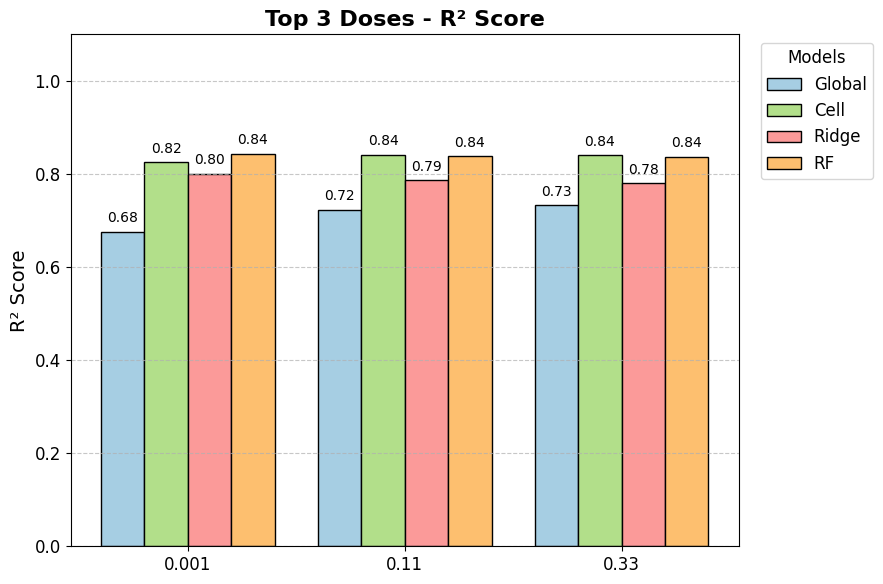

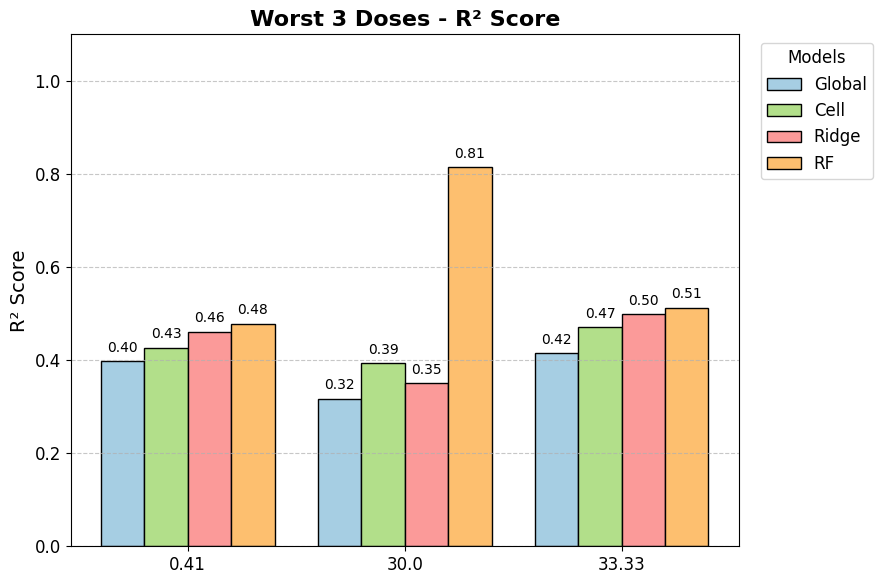

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from sklearn.metrics import r2_score

# -----------------------------
# Load predictions and test data
# -----------------------------
fold = 0
pred_dir = "predictions_fold"

df_test       = pd.read_csv(f"{pred_dir}/df_test_fold{fold}.csv")
Y_test        = np.load(f"{pred_dir}/Y_test_fold{fold}.npy")
y_pred_global = np.load(f"{pred_dir}/y_pred_global_fold{fold}.npy")
y_pred_cell   = np.load(f"{pred_dir}/y_pred_cell_fold{fold}.npy")
y_pred_ridge  = np.load(f"{pred_dir}/y_pred_ridge_fold{fold}.npy")
y_pred_rf     = np.load(f"{pred_dir}/y_pred_rf_fold{fold}.npy")

predictions = {
    "Global": y_pred_global,
    "Cell": y_pred_cell,
    "Ridge": y_pred_ridge,
    "RF": y_pred_rf
}

# -----------------------------
# Compute R² per dose
# -----------------------------
def r2_per_dose(df, y_true, y_pred):
    dose_scores = {}
    for dose in df['pert_dose'].unique():
        idx = np.where(df['pert_dose'].values == dose)[0]
        if len(idx) == 0:
            continue
        scores = [r2_score(y_true[i], y_pred[i]) for i in idx]
        dose_scores[dose] = np.mean(scores)
    return dose_scores

# Compute R² for all models
r2_scores_all = {name: r2_per_dose(df_test, Y_test, pred)
                 for name, pred in predictions.items()}

# Average across models to rank doses
avg_score_per_dose = {}
for dose in df_test['pert_dose'].unique():
    scores = [r2_scores_all[m][dose] for m in predictions if dose in r2_scores_all[m]]
    if scores:
        avg_score_per_dose[dose] = np.mean(scores)

# Best and worst 3 doses
sorted_doses = sorted(avg_score_per_dose.items(), key=lambda x: x[1])
worst_doses = [d for d, _ in sorted_doses[:3]]
best_doses  = [d for d, _ in sorted_doses[-3:]]

# -----------------------------
# Plotting function (R², calm colors)
# -----------------------------
def plot_r2_bar(doses, title):
    models = list(predictions.keys())
    # Calm pastel colors
    colors = ['#a6cee3', '#b2df8a', '#fb9a99', '#fdbf6f']
    n_models = len(models)
    bar_width = 0.2
    x = np.arange(len(doses))

    rcParams.update({'font.size': 12})
    plt.figure(figsize=(9,6))

    for i, (model, color) in enumerate(zip(models, colors)):
        scores = [r2_scores_all[model][d] for d in doses]
        plt.bar(x + i*bar_width, scores, width=bar_width, color=color, label=model, edgecolor='black')

        # Add numeric labels on top
        for j, val in enumerate(scores):
            plt.text(x[j] + i*bar_width, val + 0.02, f"{val:.2f}", ha='center', fontsize=10)

    plt.xticks(x + bar_width*(n_models-1)/2, doses, fontsize=12)
    plt.ylabel("R² Score", fontsize=14)
    plt.title(title, fontsize=16, fontweight='bold')
    plt.ylim(0, 1.1)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Legend outside
    plt.legend(title="Models", bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# -----------------------------
# Plot Top 3 and Worst 3 Doses
# -----------------------------
plot_r2_bar(best_doses, "Top 3 Doses - R² Score")
plot_r2_bar(worst_doses, "Worst 3 Doses - R² Score")

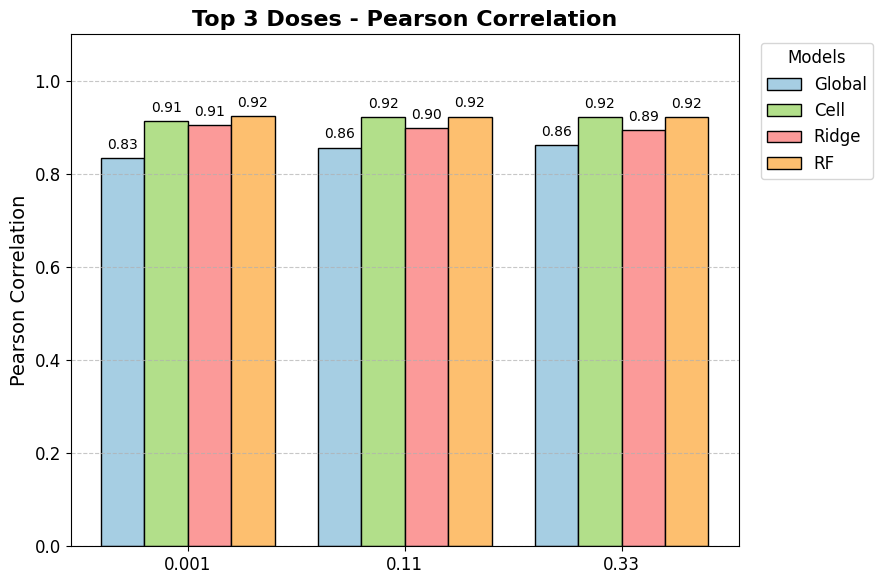

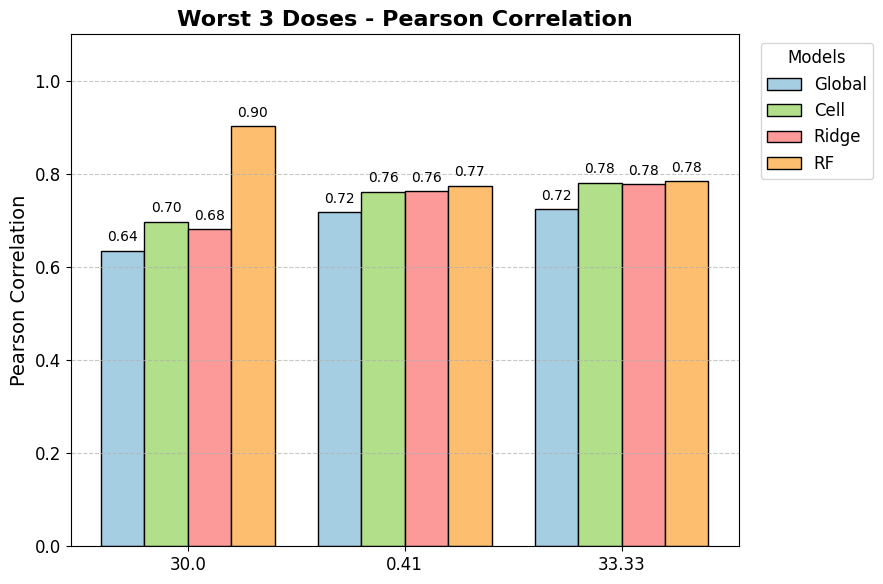

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr

# -----------------------------
# Load predictions and test data
# -----------------------------
fold = 0
pred_dir = "predictions_fold"

df_test       = pd.read_csv(f"{pred_dir}/df_test_fold{fold}.csv")
Y_test        = np.load(f"{pred_dir}/Y_test_fold{fold}.npy")
y_pred_global = np.load(f"{pred_dir}/y_pred_global_fold{fold}.npy")
y_pred_cell   = np.load(f"{pred_dir}/y_pred_cell_fold{fold}.npy")
y_pred_ridge  = np.load(f"{pred_dir}/y_pred_ridge_fold{fold}.npy")
y_pred_rf     = np.load(f"{pred_dir}/y_pred_rf_fold{fold}.npy")

predictions = {
    "Global": y_pred_global,
    "Cell": y_pred_cell,
    "Ridge": y_pred_ridge,
    "RF": y_pred_rf
}

# -----------------------------
# Safe Pearson function
# -----------------------------
def safe_pearson(a, b):
    if np.std(a) == 0 or np.std(b) == 0:
        return 0
    r, _ = pearsonr(a, b)
    return 0 if np.isnan(r) else r

# -----------------------------
# Compute Pearson per dose
# -----------------------------
def pearson_per_dose(df, y_true, y_pred):
    dose_scores = {}
    for dose in df['pert_dose'].unique():
        idx = np.where(df['pert_dose'].values == dose)[0]
        if len(idx) == 0:
            continue
        scores = [safe_pearson(y_true[i], y_pred[i]) for i in idx]
        dose_scores[dose] = np.mean(scores)
    return dose_scores

# Compute Pearson for all models
pearson_scores_all = {name: pearson_per_dose(df_test, Y_test, pred) 
                      for name, pred in predictions.items()}

# Average across models to rank doses
avg_score_per_dose = {}
for dose in df_test['pert_dose'].unique():
    scores = [pearson_scores_all[m][dose] for m in predictions if dose in pearson_scores_all[m]]
    if scores:
        avg_score_per_dose[dose] = np.mean(scores)

# Best and worst 3 doses
sorted_doses = sorted(avg_score_per_dose.items(), key=lambda x: x[1])
worst_doses = [d for d, _ in sorted_doses[:3]]
best_doses  = [d for d, _ in sorted_doses[-3:]]

# -----------------------------
# Plotting function (calm colors, legend outside)
# -----------------------------
def plot_pearson_bar(doses, title):
    models = list(predictions.keys())
    # Calm pastel colors
    colors = ['#a6cee3', '#b2df8a', '#fb9a99', '#fdbf6f']
    n_models = len(models)
    bar_width = 0.2
    x = np.arange(len(doses))

    # Figure settings
    rcParams.update({'font.size': 12})
    plt.figure(figsize=(9,6))

    # Plot bars
    for i, (model, color) in enumerate(zip(models, colors)):
        scores = [pearson_scores_all[model][d] for d in doses]
        plt.bar(x + i*bar_width, scores, width=bar_width, color=color, label=model, edgecolor='black')

        # Optional: add numeric values on top of bars
        for j, val in enumerate(scores):
            plt.text(x[j] + i*bar_width, val + 0.02, f"{val:.2f}", ha='center', fontsize=10)

    # X-axis labels
    plt.xticks(x + bar_width*(n_models-1)/2, doses, fontsize=12)
    plt.ylabel("Pearson Correlation", fontsize=14)
    plt.title(title, fontsize=16, fontweight='bold')
    plt.ylim(0, 1.1)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Move legend outside
    plt.legend(title="Models", bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# -----------------------------
# Plot Top 3 and Worst 3 Doses
# -----------------------------
plot_pearson_bar(best_doses, "Top 3 Doses - Pearson Correlation")
plot_pearson_bar(worst_doses, "Worst 3 Doses - Pearson Correlation")

In [12]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from sklearn.metrics import r2_score

# -----------------------------
# CONFIG
# -----------------------------
fold = 0
pred_dir = "/sybig/home/shs/projects/project1_L1000/results/predictions_fold"

# -----------------------------
# LOAD DATA
# -----------------------------
df_test = pd.read_csv(f"{pred_dir}/df_test_fold{fold}.csv")
Y_test  = np.load(f"{pred_dir}/Y_test_fold{fold}.npy")

predictions = {
    "Global": np.load(f"{pred_dir}/y_pred_global_fold{fold}.npy"),
    "Cell":   np.load(f"{pred_dir}/y_pred_cell_fold{fold}.npy"),
    "Ridge":  np.load(f"{pred_dir}/y_pred_ridge_fold{fold}.npy"),
    "RF":     np.load(f"{pred_dir}/y_pred_rf_fold{fold}.npy"),
}

# -----------------------------
# AUTO SELECT DOSE
# -----------------------------
dose_value = df_test['pert_dose'].value_counts().idxmax()
print(f"\n📌 Fold {fold} | Dose: {dose_value}")

# -----------------------------
# SAFE METRICS
# -----------------------------
def safe_pearson(a, b):
    if np.std(a) == 0 or np.std(b) == 0:
        return 0
    r, _ = pearsonr(a, b)
    return 0 if np.isnan(r) else r

def safe_r2(a, b):
    try:
        return r2_score(a, b)
    except:
        return 0

# -----------------------------
# FILTER DOSE
# -----------------------------
idx = np.where(df_test['pert_dose'].values == dose_value)[0]

# -----------------------------
# CHECK pert_iname column
# -----------------------------
print("\nAvailable columns:")
print(df_test.columns)

# ⚠️ make sure 'pert_iname' exists, otherwise replace with correct name

# -----------------------------
# ANALYZE
# -----------------------------
for model_name, y_pred in predictions.items():

    print(f"\n================ {model_name} =================")

    results = []

    for i in idx:
        y_true = Y_test[i]
        y_hat  = y_pred[i]

        results.append({
            "cell_id": df_test.iloc[i].get("cell_id", "NA"),
            "pert_iname": df_test.iloc[i].get("pert_iname", "NA"),
            "dose": df_test.iloc[i]['pert_dose'],
            "pearson": safe_pearson(y_true, y_hat),
            "r2": safe_r2(y_true, y_hat)
        })

    df_scores = pd.DataFrame(results)
    df_scores = df_scores.sort_values(by="pearson", ascending=False)

    # -----------------------------
    # OUTPUT
    # -----------------------------
    print("\n✅ Top 3 BEST samples:")
    print(df_scores.head(3).to_string(index=False))

    print("\n❌ Worst 3 samples:")
    print(df_scores.tail(3).to_string(index=False))

    print("\n---------------------------------------------")


📌 Fold 0 | Dose: 10.0

Available columns:
Index(['dataset_name', 'sig_id', 'pert_id', 'pert_iname', 'pert_type',
       'cell_id', 'pert_idose', 'pert_itime', 'condition', 'canonical_smiles',
       'valid_smiles', 'pert_dose', 'pert_dose_unit', 'inchi_key', 'chembl_id',
       'mechanism_of_action', 'action_type', 'action_type_filtered',
       'mechanism_of_action_filtered', 'split', 'combined_batch'],
      dtype='object')

================ Global =================

✅ Top 3 BEST samples:
cell_id    pert_iname  dose  pearson       r2
   A549     sulmazole  10.0 0.913462 0.793805
    PC3 BRD-K14790374  10.0 0.913379 0.799535
    PC3   huperzine-a  10.0 0.912214 0.799826

❌ Worst 3 samples:
cell_id    pert_iname  dose   pearson        r2
   THP1 BRD-K28112517  10.0 -0.037887 -0.752870
    PC3 BRD-K71970656  10.0 -0.055911 -0.636536
   MCF7   doxorubicin  10.0 -0.106946 -0.720723

---------------------------------------------

================ Cell =================

✅ Top 3 BEST sampl